<h1><center>Exploring car sales on Ebay-Kleinanzeigen</center></h1>
<h3><center>Exploratory data analysis on Ebay car sales in Germany</center></h3>
    
eBay Inc. is an American multinational e-commerce corporation based in San Jose, California, that facilitates consumer-to-consumer and business-to-consumer sales through its website. eBay Kleinanzeigen is a online classified advertisement market in Germany, handles from mobile devices.<br>

The aim of the project is to analyse the car sales data scrapped from eBay Kleinanzeigen and discover patterns in the listings. The dataset was scrapped and uplaoded to <a href="https://www.kaggle.com/orgesleka/used-cars-database/data">Kaggle</a>, the dataset is in german.<br>
The following questions are answered through the analysis:-

* How old are the cars listed on the website? How are they priced?
* Who are the top manufacturers? 
* What vehicle types are popular? Are the high-end priced vehicles most popular?
* Which models are listed the most on the website? What could be the reason behind this?
* Find the areas with high listings of vehicles. Are the listings increasing each year/month?
* How do the prices vary with kilometers travelled for a listed vehicle?

A few columns are described as below:-

    dateCrawled - When this ad was first crawled. All field-values are taken from this date.
    name - Name of the car.
    seller - Whether the seller is private or a dealer.
    offerType - The type of listing.
    price - The price on the ad to sell the car.
    abtest - Whether the listing is included in an A/B test.
    vehicleType - The vehicle Type.
    yearOfRegistration - The year in which the car was first registered.
    gearbox - The transmission type.
    powerPS - The power of the car in PS.
    model - The car model name.
    kilometer - How many kilometers the car has driven.
    monthOfRegistration - The month in which the car was first registered.
    fuelType - What type of fuel the car uses.
    brand - The brand of the car.
    notRepairedDamage - If the car has a damage which is not yet repaired.
    dateCreated - The date on which the eBay listing was created.
    nrOfPictures - The number of pictures in the ad.
    postalCode - The postal code for the location of the vehicle.
    lastSeenOnline - When the crawler saw this ad last online.

Importing and cleaning the dataset before starting the analysis.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import re
import datetime
from pgeocode import Nominatim
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
pd.set_option('display.float_format', lambda x: '%.5f' % x)

/home/hp/anaconda3/envs/r_env/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning:

The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.



In [2]:
df = pd.read_csv("autos.csv",encoding='Latin-1', parse_dates=['dateCrawled','dateCreated','lastSeen'])
print(df.shape)
df.head(5)

(50000, 20)


,dateCrawled,name,seller,offerType,price,abtest,vehicleType,yearOfRegistration,gearbox,powerPS,model,odometer,monthOfRegistration,fuelType,brand,notRepairedDamage,dateCreated,nrOfPictures,postalCode,lastSeen
0,2016-03-26 17:47:46,Peugeot_807_160_NAVTECH_ON_BOARD,privat,Angebot,"$5,000",control,bus,2004,manuell,158,andere,"150,000km",3,lpg,peugeot,nein,2016-03-26,0,79588,2016-04-06 06:45:54
1,2016-04-04 13:38:56,BMW_740i_4_4_Liter_HAMANN_UMBAU_Mega_Optik,privat,Angebot,"$8,500",control,limousine,1997,automatik,286,7er,"150,000km",6,benzin,bmw,nein,2016-04-04,0,71034,2016-04-06 14:45:08
2,2016-03-26 18:57:24,Volkswagen_Golf_1.6_United,privat,Angebot,"$8,990",test,limousine,2009,manuell,102,golf,"70,000km",7,benzin,volkswagen,nein,2016-03-26,0,35394,2016-04-06 20:15:37
3,2016-03-12 16:58:10,Smart_smart_fortwo_coupe_softouch/F1/Klima/Pan...,privat,Angebot,"$4,350",control,kleinwagen,2007,automatik,71,fortwo,"70,000km",6,benzin,smart,nein,2016-03-12,0,33729,2016-03-15 03:16:28
4,2016-04-01 14:38:50,Ford_Focus_1_6_Benzin_TÜV_neu_ist_sehr_gepfleg...,privat,Angebot,"$1,350",test,kombi,2003,manuell,0,focus,"150,000km",7,benzin,ford,nein,2016-04-01,0,39218,2016-04-01 14:38:50


For ease of analysis, a few column names are changed as below.

In [3]:
rm_cols = [
    'dateCrawled',
    'lastSeen',
    'nrOfPictures',
    'name'
]

new_cols = {'offerType':'offer_type',
           'vehicleType':'vehicle_type','yearOfRegistration':'registration_year',
           'powerPS':'power_PS','monthOfRegistration':'registration_month',
           'fuelType':'fuel_type','notRepairedDamage':'repaired_damage',
           'dateCreated':'date_created',
           'postalCode':'postal_code'}
        
df.rename(columns=new_cols,inplace=True)
df.drop(rm_cols,axis=1,inplace=True)
df.columns

Index(['seller', 'offer_type', 'price', 'abtest', 'vehicle_type',
       'registration_year', 'gearbox', 'power_PS', 'model', 'odometer',
       'registration_month', 'fuel_type', 'brand', 'repaired_damage',
       'date_created', 'postal_code'],
      dtype='object')

In [4]:
df.isna().sum()

seller                   0
offer_type               0
price                    0
abtest                   0
vehicle_type          5095
registration_year        0
gearbox               2680
power_PS                 0
model                 2758
odometer                 0
registration_month       0
fuel_type             4482
brand                    0
repaired_damage       9829
date_created             0
postal_code              0
dtype: int64

Only a few columns have null values, namely *vehicle_type*, *registration_year*, *model*, *repaired_damage* and *fuel_type*. Since these are real time listings, there is no way these values can be imputed and hence are dropped from the dataset. 

In [5]:
df.dropna(inplace=True)
df.head(5)

,seller,offer_type,price,abtest,vehicle_type,registration_year,gearbox,power_PS,model,odometer,registration_month,fuel_type,brand,repaired_damage,date_created,postal_code
0,privat,Angebot,"$5,000",control,bus,2004,manuell,158,andere,"150,000km",3,lpg,peugeot,nein,2016-03-26,79588
1,privat,Angebot,"$8,500",control,limousine,1997,automatik,286,7er,"150,000km",6,benzin,bmw,nein,2016-04-04,71034
2,privat,Angebot,"$8,990",test,limousine,2009,manuell,102,golf,"70,000km",7,benzin,volkswagen,nein,2016-03-26,35394
3,privat,Angebot,"$4,350",control,kleinwagen,2007,automatik,71,fortwo,"70,000km",6,benzin,smart,nein,2016-03-12,33729
4,privat,Angebot,"$1,350",test,kombi,2003,manuell,0,focus,"150,000km",7,benzin,ford,nein,2016-04-01,39218


The *price* and the *odometer* columns are actually numeric in nature, but due to the addition of '$' and 'km', they have been marked as objects. These columns are cleaned for further analysis. The *odometer* column's name has been changed to *odometer_km* for intuitiveness

In [6]:
df.price = df.price.str.replace('$','')
df.price = df.price.str.replace(',','').astype('int32')
df.odometer = df.odometer.str.replace('km','')
df.odometer = df.odometer.str.replace(',','').astype('int32')
df.rename(columns={'odometer':'odometer_km'},inplace=True)

The first column to be analysed is the *price* column.

In [7]:
df.price.describe()

count      35047.00000
mean        7442.56476
std        89491.39433
min            0.00000
25%         1500.00000
50%         3800.00000
75%         8600.00000
max     12345678.00000
Name: price, dtype: float64

In [8]:
df[df.price >= 200000]

,seller,offer_type,price,abtest,vehicle_type,registration_year,gearbox,power_PS,model,odometer_km,registration_month,fuel_type,brand,repaired_damage,date_created,postal_code
514,privat,Angebot,999999,test,kombi,2009,manuell,101,focus,125000,4,benzin,ford,nein,2016-03-17,12205
2897,privat,Angebot,11111111,test,limousine,1973,manuell,48,escort,50000,3,benzin,ford,nein,2016-03-12,94469
12682,privat,Angebot,265000,control,coupe,2016,automatik,500,911,5000,3,benzin,porsche,nein,2016-03-28,70193
34723,privat,Angebot,299000,test,coupe,1977,manuell,260,911,100000,7,benzin,porsche,nein,2016-03-23,61462
35923,privat,Angebot,295000,test,cabrio,2015,automatik,400,911,5000,6,benzin,porsche,nein,2016-04-03,74078
36818,privat,Angebot,350000,control,coupe,2016,manuell,500,911,5000,3,benzin,porsche,nein,2016-03-27,70499
37585,privat,Angebot,999990,test,limousine,1985,manuell,111,jetta,150000,12,benzin,volkswagen,ja,2016-03-29,50997
37840,privat,Angebot,220000,test,coupe,2008,manuell,415,911,30000,7,benzin,porsche,nein,2016-03-21,69198
47337,privat,Angebot,259000,test,cabrio,2001,manuell,400,z_reihe,20000,6,benzin,bmw,nein,2016-04-05,61462
47598,privat,Angebot,12345678,control,limousine,2001,manuell,101,vectra,150000,3,benzin,opel,nein,2016-03-31,4356


The *price* column has very high values. The mean of the column is relatively very low as compared to the max value. Thus there exist many outliers. <br>
Upon research it was found that no vehicle sold over websites dealing with used cars, sell vehicles cheaper than `$1000`. Hence the lower bound is taken to be 1000. There are cars listed upto `$200000`, these are high end vehicles from top brands such as *Porsche*, *BMW* etc. Thus this is taken to be the upper bound.

In [9]:
df = df[df.price.between(1000,200000)]

In [10]:
data=[
    go.Box(
        y= df.price,
        name= ''
    )
]

layout = go.Layout(
    title= {
        'text':'<b>Distribution of price</b>',
        'x':0.5
    },
    yaxis= go.layout.YAxis(
        title= 'price (dollars)'
    ),
    width= 800,
    height= 600
)

fig = go.Figure(data= data, layout= layout)
fig.show()

The prices of the vehicles are now distributed between 1000 dollars and 200000 dollars. <br>
The *odometer_km* column specifies the number of Kms the vehicle has already travelled. The below boxplot shows the distribution of the odometer.

In [11]:
df.odometer_km.describe()

count    29417.00000
mean    121130.12884
std      41008.12811
min       5000.00000
25%      90000.00000
50%     150000.00000
75%     150000.00000
max     150000.00000
Name: odometer_km, dtype: float64

In [12]:
data=[
    go.Box(
        y= df.odometer_km,
        name= ''
    )
]

layout = go.Layout(
    title= {
        'text':'<b>Distribution of odometer measurement</b>',
        'x':0.5
    },
    yaxis= go.layout.YAxis(
        title= 'odometer measurement (km)'
    ),
    width= 800,
    height= 600
)

fig = go.Figure(data= data, layout= layout)
fig.show()

The distribution of odometer measurements seem fine.<br>
The *power_PS* column which describes the power of the vehicle has the distribution as below. The column contains many outliers.

In [13]:
data=[
    go.Box(
        y= df.power_PS,
        name= ''
    )
]

layout = go.Layout(
    title= {
        'text':'<b>Distribution of power of vehicle (in PS)</b>',
        'x':0.5
    },
    yaxis= go.layout.YAxis(
        title= 'power (PS)'
    ),
    width= 800,
    height= 600
)

fig = go.Figure(data= data, layout= layout)
fig.show()

All the outliers are faulty values. The cars with the highest horsepower (power) in the world are not more than 1600 bhp (equivalent to PS), similarly the car with the lowest horsepower in the world is around 55 bhp (PS). Thus the column has to be capped to 1600 maximum and cutt off at 55 minimum. Values beyond these are not valid. Since the cars with such high horsepower are rare in the world, it can be fair to assume that they are definitely not in the used cars list. Thus the upper limit is lowered to a more reasonable estimate like 900. Above 900 horsepower are the epic sport cars which are custom and rare.

In [14]:
df = df[df.power_PS.between(55,900)]

In [15]:
data=[
    go.Box(
        y= df.power_PS,
        name= ''
    )
]

layout = go.Layout(
    title= {
        'text':'<b>Distribution of power of vehicle (in PS)</b>',
        'x':0.5
    },
    yaxis= go.layout.YAxis(
        title= 'power (PS)'
    ),
    width= 800,
    height= 600
)

fig = go.Figure(data= data, layout= layout)
fig.show()

There are still some outliers, but they are in the acceptable range. The outliers maybe because of sports cars listed on the website. Hence these are ingnored for now.

The *registration_year* and *registration_month* column specify the year and month the car was registered. This sort of indicates when the car was bought. The two columns seem clean except that the *registration_month* contains 0s which is not a valid month. This can be considered as missing data. Hence is removed from the dataset.

In [16]:
df[['registration_year','registration_month']].describe()

,registration_year,registration_month
count,27900.00000,27900.00000
mean,2004.62369,6.27251
std,6.01077,3.41458
min,1937.00000,0.00000
25%,2001.00000,3.00000
50%,2005.00000,6.00000
75%,2009.00000,9.00000
max,2018.00000,12.00000


In [17]:
df = df[df.registration_month != 0]

The *date_created* column specifies the date the listing was created/uploaded. This can be taken as the date the car is in the market to be sold. Thus subtracting *date_created* and *registration_year* can result in the age of the car i.e. how old the vehicle is.

In [18]:
df['upload_year'] = df.date_created.apply(lambda x: x.year)
df['vehicle_age'] = abs(df.registration_year - df.upload_year)
df.head(5)

,seller,offer_type,price,abtest,vehicle_type,registration_year,gearbox,power_PS,model,odometer_km,registration_month,fuel_type,brand,repaired_damage,date_created,postal_code,upload_year,vehicle_age
0,privat,Angebot,5000,control,bus,2004,manuell,158,andere,150000,3,lpg,peugeot,nein,2016-03-26,79588,2016,12
1,privat,Angebot,8500,control,limousine,1997,automatik,286,7er,150000,6,benzin,bmw,nein,2016-04-04,71034,2016,19
2,privat,Angebot,8990,test,limousine,2009,manuell,102,golf,70000,7,benzin,volkswagen,nein,2016-03-26,35394,2016,7
3,privat,Angebot,4350,control,kleinwagen,2007,automatik,71,fortwo,70000,6,benzin,smart,nein,2016-03-12,33729,2016,9
7,privat,Angebot,1990,control,limousine,1998,manuell,90,golf,150000,12,diesel,volkswagen,nein,2016-03-16,53474,2016,18


In [19]:
df.vehicle_age.describe()

count   27458.00000
mean       11.31641
std         5.98866
min         0.00000
25%         7.00000
50%        11.00000
75%        15.00000
max        79.00000
Name: vehicle_age, dtype: float64

The listings show that the vehicles up for sale are extremely new with age in years as 0 or very old, vintage with age 85 years. The histogram below shows the distribution of ages.

In [20]:
fig = px.histogram(df, x='vehicle_age')
fig.update_layout(
    title= dict(
        text='<b>Distribution of vehicle ages</b>',
        x=0.5
    ),
    xaxis= go.layout.XAxis(
        title='vehicle age'
    ),
    yaxis= go.layout.YAxis(
        title='frequency',
        showticklabels=False
    )
)
fig.show()

The histogram above is not very readable, thus for ease of analysis, the vehicle age column is cut into bins with the labels as given below :-

    Brand new - 0 to 5 years
    Fairly used - 5 to 15 years
    Old - 15 to 25 years
    Vintage - 25 years or more

For each of these labels, the number of vehicles listed and the average price of such vehicles is visualized in the plots below.

In [21]:
df['vehicle_age_label'] = pd.cut(
    df.vehicle_age,
    bins=[-1,5,15,25,85],
    labels=['Brand new','Fairly used','Old','Vintage']
)

grouped = df[['vehicle_age_label','vehicle_age','price']].groupby('vehicle_age_label')
vehicle_ages = grouped.agg({
    'price':'mean',
    'vehicle_age':'size'
}).reset_index().rename(columns={'price':'avg_price','vehicle_age':'counts'})

vehicle_ages.counts

0     4288
1    17569
2     5030
3      571
Name: counts, dtype: int64

In [22]:
fig = make_subplots(
    rows=2,
    cols=1,
    subplot_titles=[
        '<b>Number of vehicles listed per vehicle age category</b>',
        '<b>Average price of vehicles listed per vehicle age category</b>'
    ],
    vertical_spacing=0.15
)


fig.add_trace(
    go.Bar(
        x= vehicle_ages.vehicle_age_label,
        y= vehicle_ages.counts,
        hovertemplate= '%{x}: %{y}<extra></extra>'
    ),
    row=1,
    col=1
)


fig.add_trace(
    go.Bar(
        x= vehicle_ages.vehicle_age_label,
        y= vehicle_ages.avg_price,
        hovertemplate= '%{x}: %{y}<extra></extra>'
    ),
    row=2,
    col=1
)

fig.update_yaxes(showticklabels=False)
fig.update_xaxes(title= 'vehicle age')

fig.update_layout(height=1000, showlegend=False)
fig.show()

The following conclusions are drawn from the two plots :-

* Mostly the vehicles with aged 5 to 15 years (Fairly used) are listed on the website. With the vehicles aged more than 25 years (Vintage) the least.
* Brand new vehicles i.e. between 0 to 5 years have the highest average prices among all. Vintage cars are also sold for higher prices even though they are very old.
* The average prices of listings decreases from Brand new to Old in order.

This answers the first question - How old are the cars listed on the website? How are they priced?<br>
It is concluded that most of the vehicles listed are about 5 to 15 years old. However, the prices for a Brand new vehicle, 0 to 5 years or a Vintage vehicle, 25 years or more are priced higher than the other vehicles.<br>

The *brand* column specifies the manufacturer of the vehicle. There are vehicle from various manufacturers that are listed on the website. Vehicles from various manufacturers are priced differently. A brand like *BMW* or *Porsche* have vehicles listed at higher price as compared to *Opel* or *Fiat*. Hence it is important to consider the average price of vehicles from one manufacturer listed.<br>
A top manufacturer here is broken into two segments. One those manufacturers that are listed most and, Two those manufacturers listed with highest prices.

In [23]:
top_10_listed = df.brand.value_counts().sort_values(ascending=False)[:10]
top_10_listed

volkswagen       5523
bmw              3655
mercedes_benz    3179
audi             2862
opel             2395
ford             1637
renault          1012
peugeot           781
skoda             579
fiat              523
Name: brand, dtype: int64

In [24]:
grouped = df[['brand','price']].groupby('brand')
top_10_priced = grouped.mean().sort_values(by='price',ascending=False).reset_index().iloc[:10]
top_10_priced

,brand,price
0,porsche,44846.11638
1,land_rover,20731.81250
2,jaguar,13543.00000
3,jeep,11981.80488
4,audi,11436.58421
5,mini,11063.33521
6,mercedes_benz,10199.51180
7,bmw,9844.65198
8,chevrolet,7896.10909
9,volkswagen,7650.45102


In [25]:
fig = make_subplots(
    rows=2,
    cols=1,
    subplot_titles=[
        '<b>Number of vehicles listed per Manufacturer</b><br>'+
        'Top 10 most listed manufacturers (brands) on the website',
        '<b>Average price of vehicles listed per Manufacturer</b><br>'+
        'Top 10 most priced manufacturers (brands) listed on the website'
    ],
    vertical_spacing=0.15
)


fig.add_trace(
    go.Bar(
        x= top_10_listed.index,
        y= top_10_listed.values,
        hovertemplate= '%{x}: %{y}<extra></extra>'
    ),
    row=1,
    col=1
)


fig.add_trace(
    go.Bar(
        x= top_10_priced.brand,
        y= top_10_priced.price,
        hovertemplate= '%{x}: %{y}<extra></extra>'
    ),
    row=2,
    col=1
)

fig.update_yaxes(showticklabels=False)
fig.update_xaxes(title= 'manufacturer')

fig.update_layout(height=1000, showlegend=False)
fig.show()

The most listed brand of vehicles are :-

    * Volkswagen     * BMW           * Mercedes Benz
    * Audi           * Opel          * Ford
    * Renault        * Peugeot       * Skoda
    * Fiat
    
The most priced brand of vehicles are :-

    * Porsche          * Land Rover    * Jaguar
    * Jeep             * Audi          * Mini cooper
    * Mercedes Benz    * BMW           * Chevrolet 
    * Volkswagen
    
There are various manufacturers that are most listed as well as most priced - *Volkswagen*, *Mercedes Benz*, *Audi* and *BMW*. All these are German manufacturers and vehicles of these brands are most bought and are of a premium price range. This can give insights into the kind of market germany is. The following theories can be developed :-

* People prefer buying country made vehicles even though they sport a higher price range.
* Given these vehicles also are most listed indicates that people are migrating from one vehicle to another, but it cannot be said whether the people are migrating to a different manufacturer or not.

<br>

The *vehicle_type* column describes the type of the chassis. The names are given in German as below:-

    Limousine - Sedan
    Kleinwagen - Compact
    Kombi - Estate/station wagon
    Coupe - Coupe
    Cabrio - Convertible
    Bus - Bus
    SUV - SUV
    Andere - Others

In [26]:
df.vehicle_type.unique()

array(['bus', 'limousine', 'kleinwagen', 'coupe', 'suv', 'cabrio',
       'kombi', 'andere'], dtype=object)

In [27]:
grouped = df[['vehicle_type','price']].groupby('vehicle_type')
chassis_cnt = grouped.mean().reset_index().sort_values('price',ascending=False)
chassis_cnt

,vehicle_type,price
7,suv,14420.05643
3,coupe,13612.94441
2,cabrio,12036.05525
1,bus,7663.94356
6,limousine,7545.82716
5,kombi,7381.23940
0,andere,6020.02920
4,kleinwagen,4468.32776


In [28]:
fig = make_subplots(
    rows=2,
    cols=1,
    subplot_titles=[
        '<b>Number of vehicles listed per Type of vehicle (chassis)</b>',
        '<b>Average price of vehicles listed per Type of vehicle (chassis)</b>'
    ],
    vertical_spacing=0.15
)


fig.add_trace(
    go.Bar(
        x= df.vehicle_type.value_counts().index,
        y= df.vehicle_type.value_counts().values,
        hovertemplate= '%{x}: %{y}<extra></extra>'
    ),
    row=1,
    col=1
)


fig.add_trace(
    go.Bar(
        x= chassis_cnt.vehicle_type,
        y= chassis_cnt.price,
        hovertemplate= '%{x}: %{y}<extra></extra>'
    ),
    row=2,
    col=1
)

fig.update_yaxes(showticklabels=False)
fig.update_xaxes(title= 'type of vehicle (chassis)')

fig.update_layout(height=1000, showlegend=False)
fig.show()

The two plots show:-
    
* A *limousine* (sedan) is the most listed type of vehicle on the website.
* The vehicle types - *SUV*, *Coupe* and *Cabrio* are the most expensive vehicles listed on the website. Though they are less in number.
* The website mostly lists cheaper vehicle types such as *limousine*, *kleinwagen* and *kombi*

The division of vehciles types listed as compared to all the vehicles listed on the website is shown below using a pie chart.

In [29]:
data= [
    go.Pie(
        labels= df.vehicle_type.value_counts().index,
        values= df.vehicle_type.value_counts().values,
        marker= dict(
            line= dict(width=1),
        ),
        marker_colors= px.colors.colorbrewer.Set2,
        hole= 0.3,
        hovertemplate= '%{label}: %{percent}<extra></extra>'
    )
]

layout= go.Layout(
    title= {
        'text':'<b>Distribution of vehicle types listed on website</b>',
        'x':0.5
    }
)

fig = go.Figure(data= data, layout= layout)
fig.show()

As concluded earlier, more than 50% of the vehicles listed on the website are of type - *limousine*, *Kleinwagen* and *Kombi*.<br>
This indicates that the used vehicles market mainly deals with cheaper and smaller cars as most of them listed are of such type. Even though luxury and high priced vehicles are listed, they are lesser in proportion. If the current conclusions are overlapped with the previous conclusions from the analysis of manufacturers, it can be said that, most vehicles listed are country made and on a bit cheaper end in terms of vehicle type.
<br>

The *model* column specifies the model of the car. For better understanding, the model and the brand column are merged to give the name of the vehicle. The analysis and visualizations below show the top 10 most listed vehicle on the website.

In [30]:
df['vehicle'] = df.brand+" "+df.model
vehicle_names = df.vehicle.value_counts()[:10][::-1]
vehicle_names

audi a6                    598
audi a3                    599
mercedes_benz e_klasse     695
opel astra                 762
mercedes_benz c_klasse     826
bmw 5er                    848
audi a4                    854
volkswagen passat          864
bmw 3er                   1812
volkswagen golf           2227
Name: vehicle, dtype: int64

In [31]:
data= [
    go.Bar(
        y= vehicle_names.index,
        x= vehicle_names.values,
        orientation='h',
        marker= dict(color=['#009999','#009999','#009999',
                            '#009999','#009999','#009999',
                            '#009999','#009999','#ff9933',
                           '#ff9933'
                           ]
                    ),
        hovertemplate= '%{y}: %{x}<extra></extra>'
    )
]

layout= go.Layout(
    title= {
        'text':'<b>Top 10 vehicles by model listed on the website</b><br>'+
        'Number of listings per vehicle model on the website (top 10)',
        'x':0.5
    },
    xaxis= go.layout.XAxis(
        title= 'number of vehicles',
        showticklabels= False
    ),
    yaxis= go.layout.YAxis(
        title= 'vehicle model'
    )
)

fig= go.Figure(data= data, layout= layout)

fig.add_shape(
    x0=900,
    y0=-0.5,
    x1=900,
    y1=9.6,
    line= dict(
        color= 'crimson',
        width=2,
        dash= 'dash'
    )
)

fig.show()

The plot shows the top 10 vehicle models that are listed most on the website. The two vehicles that cross the 1000 mark are *Volkswagen Golf* and *BMW 3 series*. This indicates that these vehicles are maybe outdated in the market or are not as great as advertised and hence they are being sold the most.<br>
All the vehicles in the top 10 are all German made. This can indicate two things -
* People are dissatisfied with the german made manufacturers especially these models
* They are looking to upgrade their model maybe with the same manufacturer or some other manufacturer.

The plot below can maybe highlight the reason for the above with respect to the two most listed model.


In [32]:
golf_cnts = df[df.vehicle == 'volkswagen golf'].vehicle_age_label.value_counts().iloc[[2,0,1,3]][::-1]
golf_cnts

Vintage          54
Old             634
Fairly used    1128
Brand new       411
Name: vehicle_age_label, dtype: int64

In [33]:
bmw_cnts = df[df.vehicle == 'bmw 3er'].vehicle_age_label.value_counts().iloc[[2,0,1,3]][::-1]
bmw_cnts

Vintage          37
Old             557
Fairly used    1093
Brand new       125
Name: vehicle_age_label, dtype: int64

In [34]:
data= [
    go.Bar(
        y= golf_cnts.index,
        x= golf_cnts.values,
        marker= dict(color='teal'),
        orientation='h',
        text= golf_cnts.values,
        hovertemplate= '%{text}<extra></extra>',
        name= 'Volkswagen Golf'
    ),
    go.Bar(
        y= bmw_cnts.index,
        x= [-1 * i  for i in bmw_cnts.values],
        marker= dict(color='crimson'),
        orientation='h',
        text= bmw_cnts.values,
        hovertemplate= '%{text}<extra></extra>',
        name= 'BMW 3 Series'
    )
]

layout= go.Layout(
    title= {
        'text':'<b>Number of vehicle models listed per age category</b><br>'+
        'Number of Volkswagen Golf and BMW 3 series listed per age category',
        'x':0.5
    },
    xaxis= go.layout.XAxis(
        title= 'number of listings',
        range= [-1150,1150],
        showticklabels= False
    ),
    barmode= 'overlay'
)

fig= go.Figure(data=data, layout= layout)
fig.show()

The Fairly used and Old aged vehicles i.e. 5 to 25 years are the most listed for the *Volkswagen Golf* and *BMW 3 series*. This indicates that the sellers are looking for an upgrade rather than being dissatisfied with the vehicle as they used it for a good couple of years. A few Brand new vehicles are also up for sale, out of the two *Volkswagen Golf* is the most listed under that, this could raise questions regarding the popularity of the vehicle, but due to lack of data it cannot be determined.


The *repaired_damage* specifies whether a vehicle listed has been repaired of all damages or the vehicle listed has damages and the buyer is expected to take care of them. The values of the column are *nein* (No) and *Ja* (Yes). The two bar plots below show the number of vehicles listed for both and the average prices.

In [35]:
grouped = df[['repaired_damage','price']].groupby('repaired_damage')
damage_repair = grouped.mean().reset_index().sort_values('price',ascending=False)
damage_repair

,repaired_damage,price
1,nein,8359.08142
0,ja,4180.70068


In [36]:
fig = make_subplots(
    rows=1,
    cols=2,
    subplot_titles=[
        '<b>Number of vehicles with repaired and not repaired damages</b>',
        '<b>Average price of repaired vs not repaired vehicles</b>'
    ],
    horizontal_spacing= 0.2
)

fig.add_trace(
    go.Bar(
        x= df.repaired_damage.value_counts(normalize=True).index,
        y= df.repaired_damage.value_counts(normalize=True).values * 100,
        hovertemplate= '%{y:.2f}%<extra></extra>'
    ),
    row=1,
    col=1
)

fig.add_trace(
    go.Bar(
        x= damage_repair.repaired_damage,
        y= damage_repair.price,
        hovertemplate= '%{y:.2f}<extra></extra>'
    ),
    row=1,
    col=2
)

fig.update_yaxes(showticklabels=False)
fig.update_xaxes(title= 'Are damages repaired?')
fig.update_layout(showlegend=False)

fig.show()

The plots clearly show that most vehicles listed on the website have been repaired and are on sale in a good condition from a repair point of view. The vehicles that haven't been repaired are listed at lower cost thus expecting the buyer to eventually repair it, whereas vehicles listed after repairs boast a higher price point comparatively.<br>


The column *power_PS* specifies the brake horse power of the car in the German metric - PS (same as BHP). As a step in the analysis, this column is analyzed to discover the general trend of the power in the vehicles listed.

In [37]:
fig = px.scatter(
    df, 
    x= 'power_PS',
    y= 'price',
    trendline='lowess',
    trendline_color_override='crimson'
)

fig.update_layout(
    title= {
        'text':'<b>Price of a vehicle vs the Power of vehicle</b><br>'+
        'Price of the vehicle compared to the power the vehicle offers (in PS)',
        'x':0.5
    },
    xaxis= go.layout.XAxis(
        title= 'power of vehicle (in PS)',
    ),
    yaxis= go.layout.YAxis(
        title= 'price of vehicle (in dollars)'
    )
)

fig.show()

The LOWESS trend line indicates a slight linear relationship between the price of a vehicle and the power of the vehicle (in PS). As the power of the vehicle increases, so do the prices. Most of the vehicles listed have a power within the 55 to 350 range and a price upto 50k dollars, a very few vehicles as compared to the population have higher than 350 power (in PS) and higher price than 50k dollars. This hints that most of the vehicles for sale online are of lower category in terms of power of the vehicle as well as price. The market of buying and selling of used cars is of the economically middle class population.<br>


The *postal_code* column identifies the general location from where this vehicle was listed on the website. Locations are a good way for people to filter vehicles and find suitable ones in their area. <br>
For the analysis, the postal codes can be converted to Latitude and Longidtude points. This can help in visualizing the locations of the listings and even form cluster of locations where most cars have been listed from. There may be false entries in the *postal_code* column. These will become NaN values when converted and will be ignored.



In [38]:
def get_loc(row):
    info = geo_coder.query_postal_code(str(row))
    return [info['latitude'], info['longitude']]
    
geo_coder = Nominatim('DE')
locations = df.postal_code.apply(get_loc)

loc = pd.DataFrame(columns=['latitude','longitude'],index=locations.index)
loc.latitude = [i[0] for i in locations]
loc.longitude = [i[1] for i in locations]

df = pd.concat([df,loc],axis=1)

In [39]:
px.set_mapbox_access_token('pk.eyJ1IjoicmFqdHVsbHVyaSIsImEiOiJja2EzeDRrdXMwb3JrM2RwMDA0MzI1Yjc1In0._Ki7JTLX3lBh6gSjftf7EQ')

fig = px.scatter_mapbox(
    df,
    lat= 'latitude',
    lon= 'longitude',
    color_discrete_sequence= ['#009999'],
    zoom= 4
)

fig.update_layout(
    width=1000,
    height=550,
    title= {
        'text':'<b>Locations of vehicles listed on the website</b>',
        'x':0.5
    }
)

fig.show()

The map shows all the locations are situated within Germany and has a good spread throughout the country. There can be many urban areas and rural areas, urban areas having more access to technology and a wide spread community will have more listings as compared to the rural areas. From the map directly it is not visible which are the hotspots.<br>
Thus a clustering algorithm has been applied to form cluster of areas which will divide the locations into zones and can show which zones are hotspots for listings. Kmeans is applied on the latitude and longitude data derived from the postal codes. To select the optimal value for k clusters, the calinski harabasz score is used. The score is defined as ratio between the within-cluster dispersion and the between-cluster dispersion.

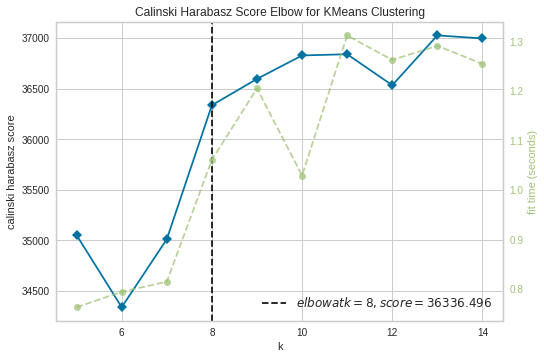

In [40]:
mod = KMeans(n_init=10)
visualizer = KElbowVisualizer(mod, k=(5,15), metric='calinski_harabasz')
visualizer.fit(df[['latitude','longitude']].dropna())
visualizer.show()

The plot below shows that an optimal value for number of clusters would be 10. The model below is trained used 10 clusters (k=10). The resulting labels will be used to assign each point in the dataset a class.

In [41]:
mod = KMeans(n_init=20, n_clusters= 10)
mod.fit(df[['latitude','longitude']].dropna())
labels = mod.labels_

ind = df[~df.latitude.isna()].index
label_sr = pd.DataFrame(labels, index=ind, columns=['label'])
df = pd.concat([df,label_sr],axis=1,ignore_index=False)

The Kmeans algorithm has labeled each point according to the clusters. A similar map representation is plotted again to visualize the clusters. This can show how the country is divided into zones which fall closest.

In [42]:
px.set_mapbox_access_token('pk.eyJ1IjoicmFqdHVsbHVyaSIsImEiOiJja2EzeDRrdXMwb3JrM2RwMDA0MzI1Yjc1In0._Ki7JTLX3lBh6gSjftf7EQ')

fig = px.scatter_mapbox(
    df,
    lat= 'latitude',
    lon= 'longitude',
    color= 'label',
    color_continuous_scale= px.colors.colorbrewer.Accent,
    zoom=4
)

fig.update_layout(
    width=1000,
    height=550,
    title= {
        'text':'<b>Cluster region of vehicles listed on the website</b>',
        'x':0.5
    },
    showlegend= False
)

fig.show()

The map shows the well defined 10 clusters that have been created. This can show the hotsopts better, for example the label 5 cluster covers the busy spots of Frankfurt and Mannheim, similarly label 2 cluster surrounds Berlin. This way the major hotspots have been highlighted and grouped into zones. Below shows the mapping of labels to the hotspots

    Label 0 -> Hambury (Region 0)
    Label 1 -> Saarburken, Strasboury (Region 1)
    Label 2 -> Nurenburg (Region 2)
    Label 3 -> Cologne, Leverkusen, Dortmund (Region 3)
    Label 4 -> Hanover (Region 4)
    Label 5 -> Berlin (Region 5)
    Label 6 -> Stuttgart (Region 6)
    Label 7 -> Bremen, Oldenburg (Region 7)
    Label 8 -> Frankfurt, Mannheim (Region 8)
    Label 9 -> Munich (Region 9)

The analysis further done now deals with the zones.

In [43]:
hotspots = {0:'Region 0',1:'Region 1',2:'Region 2',3:'Region 3'
           ,4:'Region 4',5:'Region 5',6:'Region 6',7:'Region 7'
           ,8:'Region 8',9:'Region 9'}

df.label = df.label.map(hotspots)

grouped = df[['label','price']].groupby('label')
region_prices = grouped.mean().reset_index().sort_values('price',ascending=False)
region_prices

,label,price
0,Region 0,10420.56463
4,Region 4,8637.29343
3,Region 3,8179.19086
7,Region 7,8168.74508
9,Region 9,8118.02090
6,Region 6,7962.32462
5,Region 5,7700.56178
1,Region 1,7491.43578
2,Region 2,7399.90443
8,Region 8,7369.78717


In [44]:
region_cnts = df.label.value_counts()
region_cnts = region_cnts.sort_values(ascending=False)

fig = make_subplots(
    rows=2,
    cols=1,
    subplot_titles=[
        '<b>Number of vehicles listed per Cluster region</b><br>'+
        'Number of vehicles listed on the website per zone (cluster region)',
        '<b>Average price of vehicles listed per Cluster region</b><br>'+
        'Average price of vehicles listed on the website per zone (cluster region)'
    ],
    vertical_spacing=0.15
)


fig.add_trace(
    go.Bar(
        x= region_cnts.index,
        y= region_cnts.values,
        hovertemplate= '%{x}: %{y}<extra></extra>'
    ),
    row=1,
    col=1
)


fig.add_trace(
    go.Bar(
        x= region_prices.label,
        y= region_prices.price,
        hovertemplate= '%{x}: %{y}<extra></extra>'
    ),
    row=2,
    col=1
)

fig.update_yaxes(showticklabels=False,title='number of vehicles',row=1,col=1)
fig.update_yaxes(showticklabels=False,title='average price of vehicles',row=2,col=1)
fig.update_xaxes(title= 'cluster region')

fig.update_layout(height=1000, showlegend=False)
fig.show()

In [45]:
data= [
    go.Pie(
        labels= region_cnts.index,
        values= region_cnts.values,
        marker= dict(
            line= dict(width=1),
        ),
        marker_colors= px.colors.colorbrewer.Set2,
        hole= 0.3,
        hovertemplate= '%{label}: %{percent}<extra></extra>'
    )
]

layout= go.Layout(
    title= {
        'text':'<b>Distribution of number of vehicle listed on website zone wise</b>',
        'x':0.5
    }
)

fig = go.Figure(data= data, layout= layout)
fig.show()

The three plots conclude the following :-

* The Cologne, Leverkusen and Dortmund region (region 3) has the most number of vehicle listings on the website.
* The Saarbruken, Strasboury region (region 1) have the least number of listings on the website.
* Most of the regions have similar price points listed online, except Munich (region 9) which has the highest average prices listed on the website.

The line plot below visualizes the trend of listings observed int the years 2015 and 2016 zone wise i.e. for every region the number of vehicles listed based on the date is visualized below. This shows the regions where there are more listings and regions where there are less listings per time.

In [46]:
grouped = df[['date_created','label','price']].groupby(['date_created','label'])
region_trend = grouped.count().reset_index()
region_trend.rename(columns={'price':'counts'},inplace=True)
region_trend

,date_created,label,counts
0,2015-08-10,Region 8,1
1,2015-09-09,Region 6,1
2,2015-11-10,Region 2,1
3,2015-12-30,Region 5,1
4,2016-01-07,Region 1,1
...,...,...,...
386,2016-04-07,Region 4,2
387,2016-04-07,Region 6,1
388,2016-04-07,Region 7,3
389,2016-04-07,Region 8,2


In [47]:
fig = px.line(
    region_trend,
    x= 'date_created',
    y= 'counts',
    color= 'label',
    color_discrete_sequence= px.colors.colorbrewer.Paired_r
)

fig.update_layout(
    title= {
        'text':'<b>Trend in number of listings Zone wise</b><br>'+
        'Number of vehicles listed zone wise (cluster region) between 2015 and 2016<br>',
        'x':0.5
    },
    xaxis= go.layout.XAxis(
        title= 'date',
        rangeslider_visible=True,
        rangeselector= dict(
            buttons=list([
                dict(count=1, label= 'month', step= 'month', stepmode= 'backward'),
                dict(count=1, label= 'year', step= 'year', stepmode= 'backward')
            ])
        )
    ),
    yaxis= go.layout.YAxis(
        title= 'number of listings',
        showticklabels= False
    ),
    height= 550
)


fig.show()

NOTE: The plot above is interactive, one can use the slider on x-axis to set the time frame or the buttons on the top left corner to set the step in the date. You can use the labels on the right, select/deselect the regions for which you want to observe the trend.

The following points are concluded from the trend lines:-

* Until 26 Feb, 2016 there were hardly any listings from the regions. This could be because of lack of data.
* The data scrapped was only uptil April 7th and hence the trend lines end there and see a dip.
* The Cologne, Leverkusen and Dortmund region (region 3) consistently has the highest vehicles listed. All other regions are fairly in the middle of the pack.
* There are two major dips noticed on 13 Mar, 2016 and 18 Mar, 2016. All regions listings take a hit on these dates and go considerably low compared to before and after stats. The reason for this are unclear due to lack of data.

The trend lines can be helpful in determining how the regions, over time have contributed to the listings, and which regions can be said to have high vehicles listed over time. Based on the analysis, the Cologne, Leverkusen and Dortmund region has contributed the most to the total listings on the website.

In [48]:
region_prices.sort_values(by='label',inplace=True)

centers = pd.DataFrame(columns=['latitude','longitude'], index= region_prices.index)
region_loc_prices = pd.concat([region_prices,centers],axis=1)
region_loc_prices.latitude = [i[0] for i  in mod.cluster_centers_]
region_loc_prices.longitude = [i[1] for i in mod.cluster_centers_]
region_loc_prices.price = ((region_loc_prices.price - min(region_loc_prices.price)) + 100)
region_loc_prices

,label,price,latitude,longitude
0,Region 0,3150.77747,48.39277,11.87517
1,Region 1,221.64861,51.20830,7.03582
2,Region 2,130.11727,53.76043,10.03050
3,Region 3,909.40370,50.11640,8.53851
4,Region 4,1367.50626,48.52730,9.40210
5,Region 5,430.77461,52.66286,13.28823
6,Region 6,692.53746,49.84293,10.97961
7,Region 7,898.95791,51.98440,10.04744
8,Region 8,100.00000,52.53206,8.27123
9,Region 9,848.23374,49.02042,7.52404


In [49]:
px.set_mapbox_access_token('pk.eyJ1IjoicmFqdHVsbHVyaSIsImEiOiJja2EzeDRrdXMwb3JrM2RwMDA0MzI1Yjc1In0._Ki7JTLX3lBh6gSjftf7EQ')

fig = px.scatter_mapbox(
    region_loc_prices,
    lat= 'latitude',
    lon= 'longitude',
    size= 'price',
    color= 'label',
    size_max= 55,
    hover_name= region_prices.price,
    zoom= 4
)

fig.update_layout(
    title= {
        'text':'<b>Average price of vehicles listed per Cluster region</b><br>'+
        'Average price of vehicles listed on the website per zone (cluster region)',
        'x':0.5
    },
    width=950,
    height=550
)

fig.show()

The map above shows the region wise average prices listed on the website. The size of the bubble represents the average price of the region scaled for visualization purposes. It shows the regions of Munich, Stuttgart and Frankfurt have the highest average prices of the vehicles listed.

The final conclusions drawn from the project :-

* The prices of vehicles listed are mostly below 20k dollars with the exception of some luxury/sports cars or vintage cars priced upto 200k dollars.
* Majority of vehicles listed are about 5 to 15 years old (Fairly used), these vehicles are sold at a comparatively lower price than the Vintage vehicles (> 25 years) or Brand new vehicles (0 to 5 years).
* The most listed brand of vehicles are :-

        * Volkswagen     * BMW           * Mercedes Benz
        * Audi           * Opel          * Ford
        * Renault        * Peugeot       * Skoda
        * Fiat

* The most priced brand of vehicles are :-

        * Porsche          * Land Rover    * Jaguar
        * Jeep             * Audi          * Mini cooper
        * Mercedes Benz    * BMW           * Chevrolet 
        * Volkswagen
        
* Most of the manufacturers from the above list are German manufacturers, showing that the people prefer country-made vehicles even though they are a little pricey.
* A Limousine, Kombi and a Klienwagen are most listed type of vehicles and are on the cheaper end, whereas an SUV, Coupe and Cabrio are expensive vehicle types.
* From the vehicles listed, 

        * Volkswagen Golf
        * BMW 3 series
     are the most listed model of vehicle. Upon analysis it shows that most of them listed are Fairly used indicating the seller is looking for an upgrade.
* Repaired vehicles are sold for higher prices than damaged vehicles.
* The price of the vehicle increases as the power (in PS) of the vehicle increases.
* The locations when plotted on the map show a clutter of points, thus a clustering algorithm is applied to form zones (regions) within the country.
* The following are the clusters identified by the KMeans Algorithm with 10 clusters found by calinski harabasz score,

        Label 0 -> Hambury (Region 0)
        Label 1 -> Saarburken, Strasboury (Region 1)
        Label 2 -> Nurenburg (Region 2)
        Label 3 -> Cologne, Leverkusen, Dortmund (Region 3)
        Label 4 -> Hanover (Region 4)
        Label 5 -> Berlin (Region 5)
        Label 6 -> Stuttgart (Region 6)
        Label 7 -> Bremen, Oldenburg (Region 7)
        Label 8 -> Frankfurt, Mannheim (Region 8)
        Label 9 -> Munich (Region 9)
        
    The labels divide the locations into regions which are easier to analyze.
* The Cologne, Leverkusen and Dortmund region has the highest number of listings on the website, where as Munich and Stuttgart region have the highest average price of the listings.

The conclusions answer the questions asked and give a detailed view of the scrapped listings of eBay-Kleinanzeigen.